Import di librerie utili

Allinea N immagini (aiuto di IA)

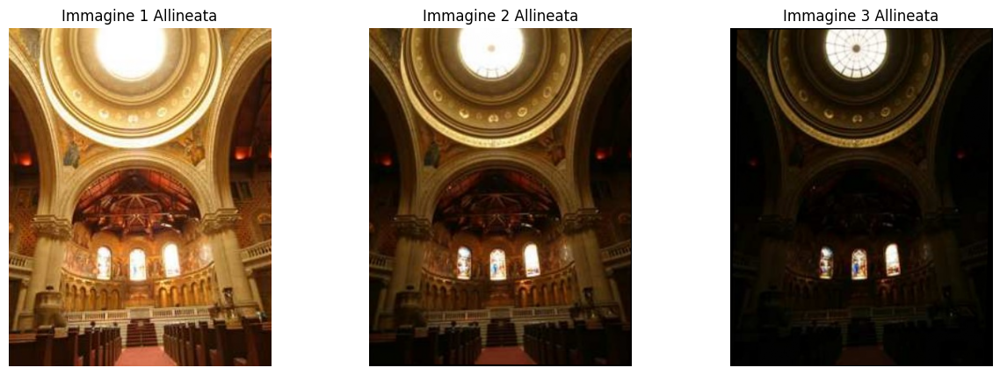

In [22]:
###########################################
#import skimage as ski
#import numpy as np
#from PIL import Image
#import matplotlib.pyplot as plt
#import scipy
#from matplotlib.image import imread
#import numpy as np
#import numpy as np
#from skimage import color
#import statistics
#import numpy as np
#from PIL import Image
#import matplotlib.pyplot as plt
#import numpy as np
#import matplotlib.pyplot as plt
###########################################

from skimage import io #, transform
from skimage.feature import ORB, match_descriptors
from skimage.color import rgb2gray
from skimage.transform import AffineTransform, warp
from skimage.measure import ransac
from skimage import color
import matplotlib.pyplot as plt
from scipy.ndimage import convolve
from scipy import misc
from PIL import Image
import math
from skimage import data
from skimage.transform import pyramid_gaussian
import numpy as np
import scipy.ndimage
import copy
from numpy import shape


def image_registration(reference_image, target_image):
    # Converti le immagini in scala di grigi
    reference_image_gray = rgb2gray(reference_image)
    target_image_gray = rgb2gray(target_image)

    # Rileva le caratteristiche delle immagini utilizzando ORB
    orb = ORB(n_keypoints=500)

    orb.detect_and_extract(reference_image_gray)
    keypoints_ref = orb.keypoints
    descriptors_ref = orb.descriptors

    orb.detect_and_extract(target_image_gray)
    keypoints_tgt = orb.keypoints
    descriptors_tgt = orb.descriptors

    # Trova le corrispondenze tra le caratteristiche delle due immagini
    matches = match_descriptors(descriptors_ref, descriptors_tgt, cross_check=True)

    # Estrai i punti corrispondenti
    src = keypoints_tgt[matches[:, 1]][:, ::-1]
    dst = keypoints_ref[matches[:, 0]][:, ::-1]

    # Utilizza RANSAC per trovare la trasformazione affine robusta
    model_robust, inliers = ransac((src, dst), AffineTransform, min_samples=4,
                                   residual_threshold=2, max_trials=100)

    # Applica la trasformazione affine all'immagine target
    target_image_aligned = warp(target_image, model_robust.inverse, output_shape=reference_image.shape)

    return target_image_aligned, model_robust

def register_images(image_paths):
    # Carica la prima immagine come riferimento
    reference_image = io.imread(image_paths[0])
    aligned_images = [reference_image]

    # Allinea ogni immagine successiva alla prima immagine
    for path in image_paths[1:]:
        target_image = io.imread(path)
        aligned_image, _ = image_registration(reference_image, target_image)
        aligned_images.append(aligned_image)

    return aligned_images

# Percorsi delle immagini
# - (necessario inserire due volte la prima immagine che in seguito verrà eliminata per poter lavorare con immagini della stessa risoluzione)
image_paths = ['C:\\Users\\domen\\Desktop\\Computer Graphics\\Prj-ExposureFusion\\Skimage_ImageRegistration\\3.5.jpg',
               'C:\\Users\\domen\\Desktop\\Computer Graphics\\Prj-ExposureFusion\\Skimage_ImageRegistration\\3.5.jpg',
               'C:\\Users\\domen\\Desktop\\Computer Graphics\\Prj-ExposureFusion\\Skimage_ImageRegistration\\3.4.jpg',
               'C:\\Users\\domen\\Desktop\\Computer Graphics\\Prj-ExposureFusion\\Skimage_ImageRegistration\\3.3.jpg'] # etc.

# Esegui la registrazione delle immagini
aligned_images = register_images(image_paths)

# Eliminazione prima immagine
aligned_images.pop(0)

# Visualizza le immagini allineate
fig, axes = plt.subplots(nrows=1, ncols=len(aligned_images), figsize=(15, 5))

for ax, img, idx in zip(axes, aligned_images, range(len(aligned_images))):
    ax.imshow(img)
    ax.set_title(f'Immagine {idx + 1} Allineata')
    ax.axis('off')

plt.show()



Controllo immagini in aligned_images

In [23]:
# PRINT DI SERVIZIO

#print(len(aligned_images))

#for img in aligned_images : 
#    plt.imshow(img[:,:,0],cmap="Reds")
#    plt.show()

#plt.imshow(aligned_images[2][:,:,0],cmap="Reds")
#plt.show()

Conversione in GrayScale utili alle successive elaborazioni

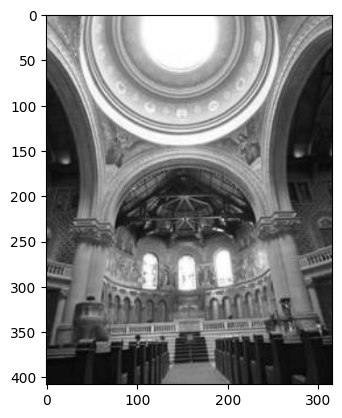

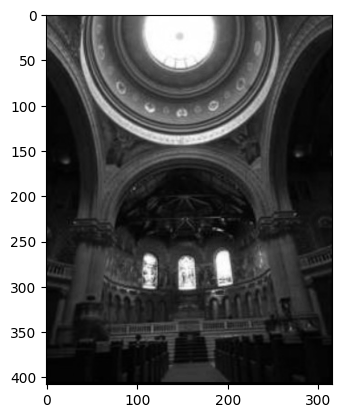

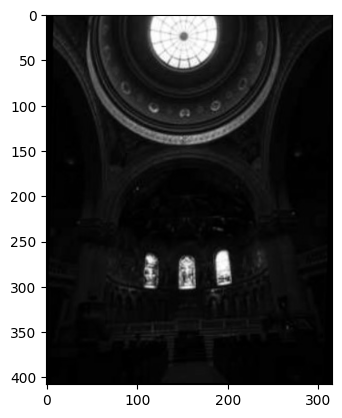

In [24]:
imgAppoggio = copy.deepcopy(aligned_images)
aligned_images_grayScale = []

for img in imgAppoggio : 
    grayscale_img = color.rgb2gray(img)
    aligned_images_grayScale.append(grayscale_img)
    plt.imshow(grayscale_img,cmap='gray')
    plt.show()

Misurazione del Contrasto con filtro Laplaciano (da medium.com)

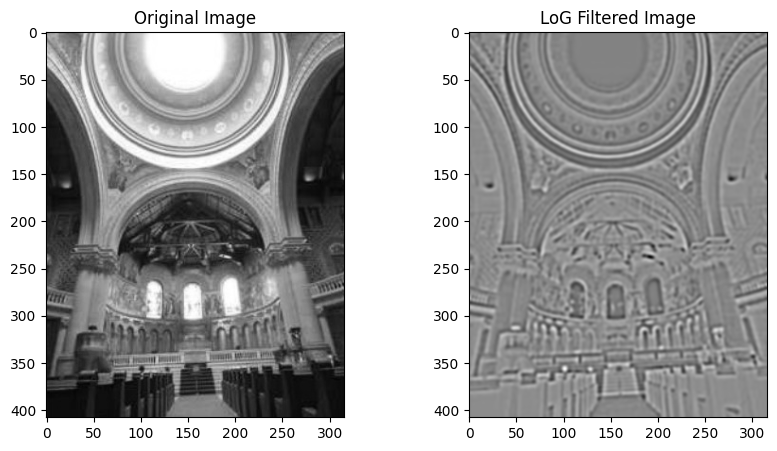

(408, 316)
-0.22702142268364184
0.18389912674763143


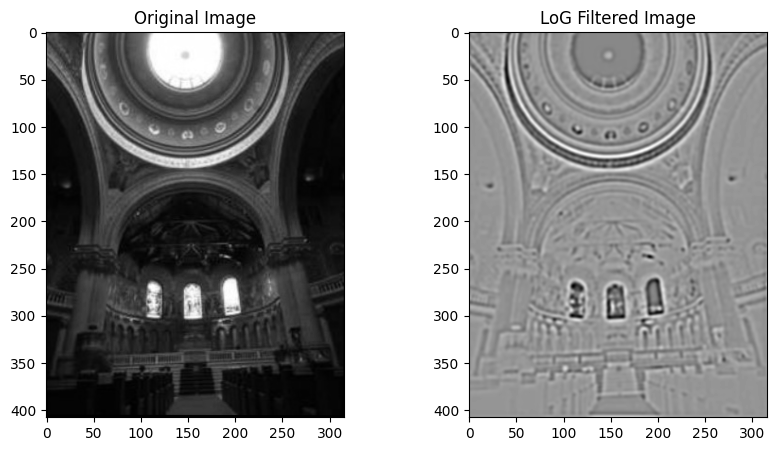

(408, 316)
-0.22702142268364184
0.18389912674763143


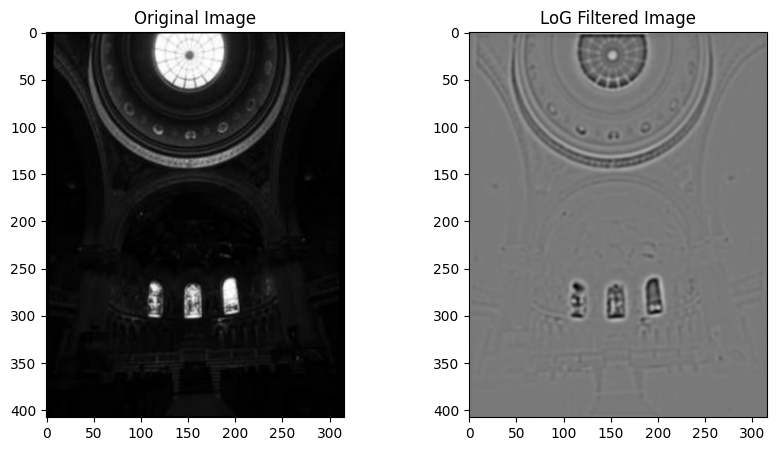

(408, 316)
-0.22702142268364184
0.18389912674763143


In [25]:
immagini_filtrate = []

# funziona presa online
def LoG_filter(image, sigma, size=None):
    # Generate LoG kernel
    if size is None:
        size = int(6 * sigma + 1) if sigma >= 1 else 7

    if size % 2 == 0:
        size += 1

    x, y = np.meshgrid(np.arange(-size//2+1, size//2+1), np.arange(-size//2+1, size//2+1))
    kernel = -(1/(np.pi * sigma**4)) * (1 - ((x**2 + y**2) / (2 * sigma**2))) * np.exp(-(x**2 + y**2) / (2 * sigma**2))
    kernel = kernel / np.sum(np.abs(kernel))

    # Perform convolution
    result = convolve(image, kernel)

    return result

for image in aligned_images_grayScale : 
    sigma = 2.0
    filtered_image = LoG_filter(image, sigma)

    immagini_filtrate.append(filtered_image)

    # Plot the original and filtered images
    plt.figure(figsize=(10, 5))
    plt.subplot(121)
    plt.imshow(image, cmap='gray')
    plt.title('Original Image')

    plt.subplot(122)
    plt.imshow(filtered_image, cmap='gray')
    plt.title('LoG Filtered Image')

    #print(image)

    plt.show()

    print(shape(immagini_filtrate[0]))
    print(np.min(immagini_filtrate[0]))
    print(np.max(immagini_filtrate[0]))
    

Calcolo del Valore assoluto del filtro Laplaciano, valore utilizzato come unità di misura per il contrasto

(408, 316)
0.0
1.0


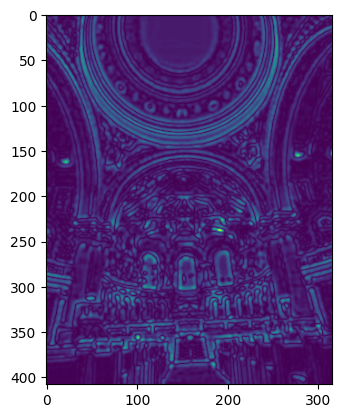

(408, 316)
0.0
1.0


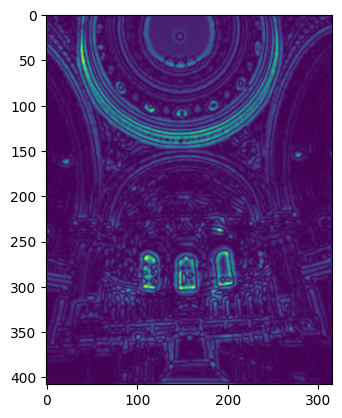

(408, 316)
0.0
1.0


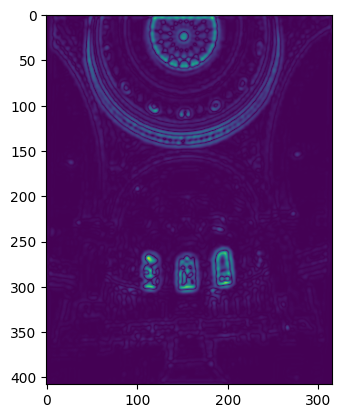

In [26]:
abs_immagini_filtrate = []

for img in immagini_filtrate: 
    abs_immagini_filtrate.append(abs(img))

#for img in abs_immagini_filtrate : 
    #plt.imshow(img,cmap="gray")
    #plt.show()
    #print(img)

C = abs_immagini_filtrate

# - PROVO A COPIARE IMMAGINI FILTRARE E PORTARLE IN 0,1
#C = immagini_filtrate

for img in C:
    # - NORMALIZZAZIONE IN 0,1
    # - - NON è CAMBIATO NULLA
    img = img - np.min(img)
    img = img / np.max(img) 
    
    print(shape(img))
    print(np.min(img))
    print(np.max(img))
    plt.imshow(img)
    plt.show()



Ricapitolando : 
- C -> ho le immagini con valore assoluto dopo avergli applicato filtro laplaciano
- aligned_images -> ho le immagini a colori post allineamento
- aligned_images_grayScale -> ho immagini allineate in grayscale

RGB split, utile al calcolo del valore di saturazione dei pixel

In [27]:
red_images = []
green_images = []
blue_images = []

imgAppoggio = copy.deepcopy(aligned_images)


# PRINT DI SERVIZIO PT.1
#print(len(aligned_images))

#for img in aligned_images :
    #plt.imshow(img)
    #plt.show() 
    #red_images.append(plt.imshow(img[:,:,0],cmap='Reds'))
    #plt.show()
    #green_images.append(plt.imshow(img[:,:,1],cmap='Greens'))
    #plt.show()
    #blue_images.append(plt.imshow(img[:,:,2],cmap='Blues'))
    #plt.show()

# Estrazione delle informazioni riguardanti un'unico canale colore e aggiunta a lista
for img in imgAppoggio :  
    red_images.append(img[:,:,0])
    green_images.append(img[:,:,1])
    blue_images.append(img[:,:,2])

# PRINT DI SERVIZIO PT.2
#print(len(red_images))
#print(len(green_images))
#print(len(blue_images))

#for img in red_images : 
    #plt.imshow(img,cmap="Reds",vmin=0)
    #plt.show()

#for img in green_images : 
    #plt.imshow(img,cmap="Greens",vmin=0)
    #plt.show()

#for img in blue_images : 
    #plt.imshow(img,cmap="Blues",vmin=0)
    #plt.show()



Normalizzazione delle immagini Red Green Blue da 0,1 a 0,255

In [28]:
for i in range(len(imgAppoggio)):
    red_images[i]*=(255.0/red_images[i].max())
    green_images[i]*=(255.0/green_images[i].max())
    blue_images[i]*=(255.0/blue_images[i].max())

#print(red_images[0].max())
#print(red_images[0].min())
#print(red_images[0].mean())
#plt.imshow(red_images[0],vmin=0,vmax=255)
#plt.show()

#rint(green_images[0].max())
#print(green_images[0].min())
#print(green_images[0].mean())
#plt.imshow(green_images[0],vmin=0,vmax=255)
#plt.show()

#print(blue_images[0].max())
#print(blue_images[0].min())
#print(blue_images[0].mean())
#plt.imshow(blue_images[0],vmin=0,vmax=255)
#plt.show()



Ricapitolando : 
- C -> ho le immagini con valore assoluto dopo avergli applicato filtro laplaciano
- aligned_images -> ho le immagini a colori post allineamento
- aligned_images_grayScale -> ho immagini allineate in grayscale
- in red_images , green_images , blue_images ho le immagini filtrate x R , G , B normalizzate 0,255

Calcolo della SATURAZIONE tramite il valore di deviazione std di ogni pixel :


(DEVIAZIONE STD : calcolo di quanto un valore si discosta dalla media dell'insieme di appartenenza)

    σ = √(Σ(xᵢ - μ)² / n)
    
σ -> è la deviazione standard

Σ -> indica la somma

xᵢ -> è ogni valore singolo del campione

μ -> è la media del campione

n -> è la dimensione del campione (numero di valori)


Shape alignedImages
(3, 408, 316, 3)
shapeS
(3, 408, 316)
0


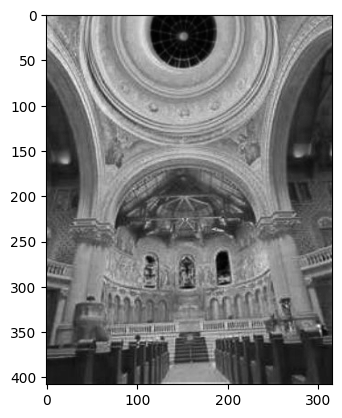

1


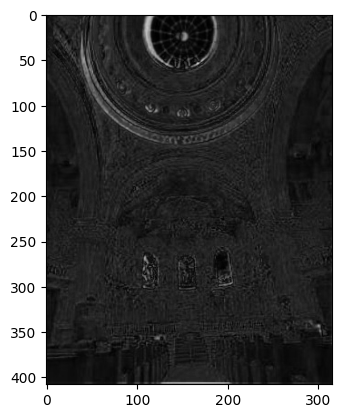

2


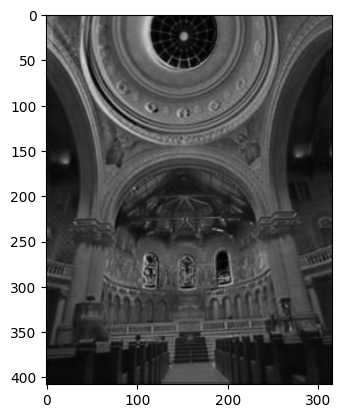

In [29]:
h,w,color = aligned_images[0].shape
totale_pixel_x_immagine = h*w

print("Shape alignedImages")
print(shape(aligned_images))

S = np.zeros(shape(aligned_images_grayScale))

print("shapeS")
print(shape(S))

# - CALCOLO deviazione std di ogni pixel
for riga in range(h):
    for colonna in range(w):
        r = []
        g = []
        b = []
        for n in range(len(aligned_images)):
            r.append(aligned_images[n][riga,colonna][0])
            #print(r[n])
            g.append(aligned_images[n][riga,colonna][1])
            #print(g[n])
            b.append(aligned_images[n][riga,colonna][2])
            #print(b[n])

        #print("--")
        #print(r)
        #print(g)
        #print(b)

        sommaRosso = 0
        sommaGreen = 0
        sommaBlue = 0

        for val in range(len(aligned_images)):
            sommaRosso = sommaRosso+r[val]
            sommaGreen = sommaGreen+g[val]
            sommaBlue = sommaBlue+b[val]

        #print("--")
        #print(sommaRosso)
        #print(sommaGreen)
        #print(sommaBlue)

        mediaRosso = sommaRosso/len(r)
        mediaVerde = sommaGreen/len(g)
        mediaBlu = sommaBlue/len(b)

        #print("--")
        #print(mediaRosso)
        #print(mediaVerde)
        #print(mediaBlu)

        differenza_media_red = []
        differenza_media_green = []
        differenza_media_blue = []

        for val in range(len(aligned_images)):
            differenza_media_red.append(((r[val] - mediaRosso)))
            differenza_media_green.append(((g[val] - mediaVerde)))
            differenza_media_blue.append(((b[val] - mediaBlu)))

        for val in range(len(aligned_images)):
            S[val][riga,colonna] = np.sqrt(differenza_media_red[val]**2 + differenza_media_green[val]**2 + differenza_media_blue[val]**2)

            

for n in range(len(S)):
    print(n)
    plt.imshow(S[n],cmap="gray")
    plt.show()

        #DS_red = []
        #DS_green = []
        #DS_blue = []
        #for val in range(len(aligned_images)):
        #    DS_red.append(differenza_media_red)
        #    DS_green.append(differenza_media_green)
        #    DS_blue.append(differenza_media_blue)
        #for val in range(len(aligned_images)):
        #    S[val][riga,colonna] = DS_red[val]




Ricapitolando : 
- C -> ho le immagini con valore assoluto dopo avergli applicato filtro laplaciano
- S -> ho le immagini con i valori di saturazione memorizzati
- aligned_images -> ho le immagini a colori post allineamento
- aligned_images_grayScale -> ho immagini allineate in grayscale
- in red_images , green_images , blue_images ho le immagini filtrate x R , G , B

Esposizione :

(calcola_valore_esposizione -> con aiuto di IA)

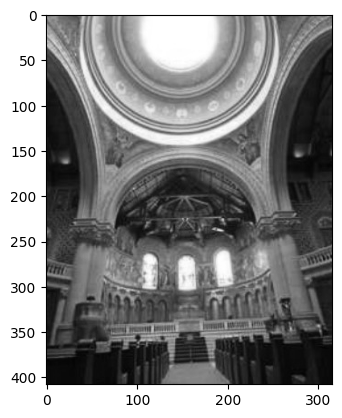

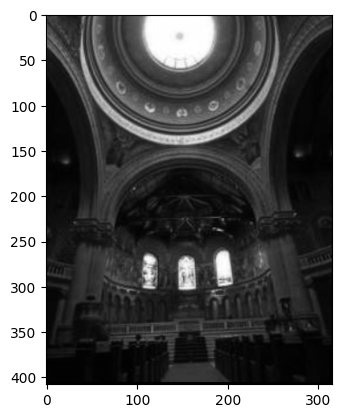

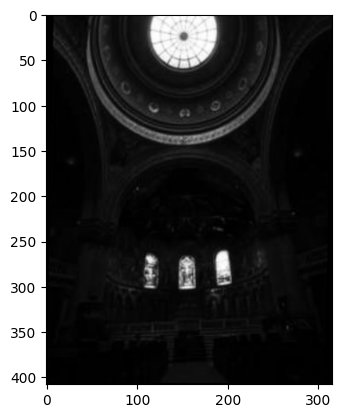

In [30]:


def calcola_valore_esposizione(immagine):
    # Carica l'immagine e converti in array numpy
    #immagine = immagine.convert('RGB')  # Assicurati che l'immagine sia in formato RGB
    img_array = np.array(immagine) / 255.0  # Normalizza l'intensità dei pixel a [0, 1]
    
    # Dimensioni dell'immagine
    altezza, larghezza, _ = img_array.shape
    
    # Funzione gaussiana per il calcolo dell'esposizione del canale
    def gaussiana(intensità_canale):
        return np.exp(-((intensità_canale - 0.5) ** 2) / (2 * 0.2 ** 2))
    
    # Calcola l'esposizione per ogni canale
    esposizione_rosso = gaussiana(img_array[:, :, 0])
    esposizione_verde = gaussiana(img_array[:, :, 1])
    esposizione_blu = gaussiana(img_array[:, :, 2])
    
    # Combina i valori di esposizione dei canali per ottenere l'esposizione del pixel
    esposizione_pixel = esposizione_rosso * esposizione_verde * esposizione_blu
    
    return esposizione_pixel

# Esempio di utilizzo
esposizione_pixel = []
for img in aligned_images:
    esposizione_pixel.append(calcola_valore_esposizione(img))

# Visualizzare il risultato come immagine di esposizione
for img in esposizione_pixel:
    plt.imshow(img,cmap="gray")
    plt.show()

E = copy.deepcopy(esposizione_pixel)

#esposizione_img = Image.fromarray((esposizione_pixel * 255).astype(np.uint8))
#esposizione_img.show()



Ricapitolando : 
- E -> matrice con valori esposizione pixel
- C -> ho le immagini con valore assoluto dopo avergli applicato filtro laplaciano
- S -> ho le immagini con i valori di saturatione memorizzati
- aligned_images -> ho le immagini a colori post allineamento
- aligned_images_grayScale -> ho immagini allineate in grayscale
- in red_images , green_images , blue_images ho le immagini filtrate x R , G , B

Calcolo delle matrici di peso mettendo insisme i valori di ogni pixel per immagine



0.0
1.0


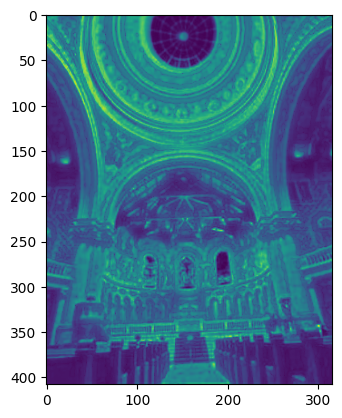

0.0
1.0


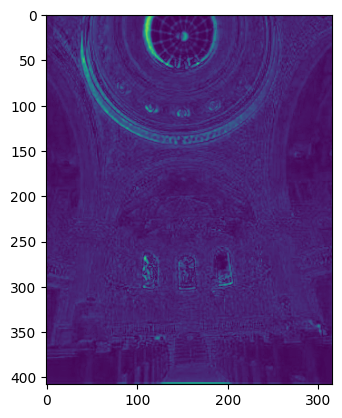

0.0
1.0


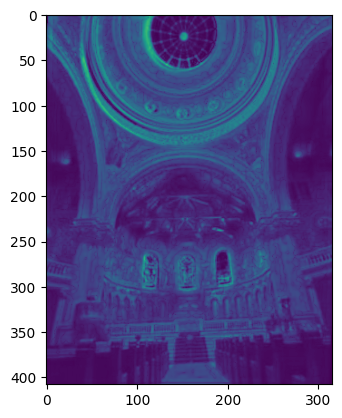

In [31]:
#W = copy.deepcopy(aligned_images_grayScale)

W = np.zeros(shape(aligned_images_grayScale))

#print("print(shape(aligned_images))")
#print(shape(aligned_images))
#print("shape(aligned_images_grayScale)")
#print(shape(aligned_images_grayScale))
#print("shape(E)")
#print(shape(E))

pesoContrasto = 0.1
pesoSaturazione = 1
pesoEsposizione = 1

#pesoContrasto = 0.1
#pesoSaturazione = 0
#pesoEsposizione = 1

# valori validi
#pesoContrasto = 0.1
#pesoSaturazione = 0.8
#pesoEsposizione = 3

# - simile a paper : 
#pesoContrasto = 0.01
#pesoSaturazione = 1
#pesoEsposizione = 2

for n in range(len(aligned_images)):
    for i in range(w):
        for j in range(h):
            # con peso
            W[n][j,i] = ((C[n][j,i]**pesoContrasto) * (S[n][j,i]**pesoSaturazione) * (E[n][j,i]**pesoEsposizione))
            # senza peso
            #W[n][j,i] = (C[n][j,i]) * (S[n][j,i]) * (E[n][j,i]) 

###############################

# - NORMALIZZAZIONE DI W TRA 0 E 1

for n in range(len(W)):
    W[n] = (W[n]-np.min(W[n]))/(np.max(W[n])-np.min(W[n]))

###############################

for img in W:
    #print(len(W))
    print(np.min(img))
    print(np.max(img))
    #print(np.mean(img))
    plt.imshow(img)
    plt.show()



Fusione delle immagini : 
- normalizzazione dei pesi dei pixel appena calcolati in modo che la somma del peso di ogni pixel in una determinata posizione sia in totale 1

Shape W
(3, 408, 316)
shape(normalized_W)
(3, 408, 316)
- - - - - - - - - - -
MAX : 
0.9424521636275833
MIN : 
0.0


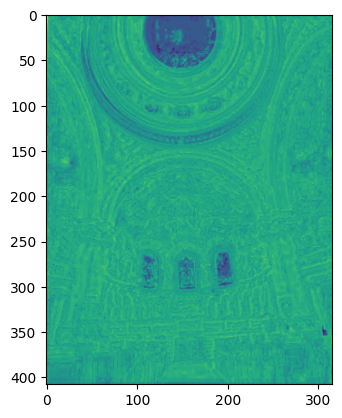

- - - - - - - - - - -
MAX : 
0.6825542716764093
MIN : 
0.0


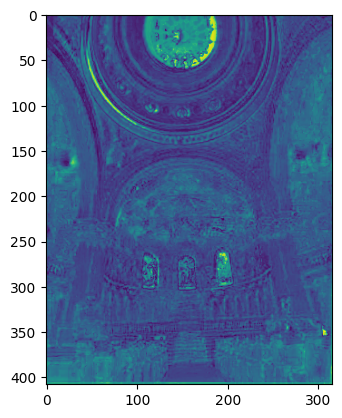

- - - - - - - - - - -
MAX : 
0.5596005181959895
MIN : 
0.0


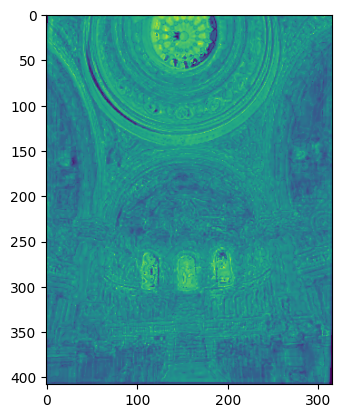

In [32]:
print("Shape W")
print(shape(W))

normalized_W = np.zeros(shape(W))

print("shape(normalized_W)")
print(shape(normalized_W))

for riga in range(h):
    for colonna in range(w):
        somma_pesi_pixel = 0
        for n in range(len(W)):
            somma_pesi_pixel = somma_pesi_pixel + W[n][riga,colonna]
        for n in range(len(W)):
            if(somma_pesi_pixel!=0):
                normalized_W[n][riga,colonna] = W[n][riga,colonna]/somma_pesi_pixel
            else :  
                normalized_W[n][riga,colonna] = 0

for val in normalized_W:
    print("- - - - - - - - - - -")
    print("MAX : ")
    print(np.max(val))
    print("MIN : ")
    print(np.min(val))
    plt.imshow(val)
    plt.show()
print("")

Ricapitolando : 
- E -> matrice con valori esposizione pixel
- C -> ho le immagini con valore assoluto dopo avergli applicato filtro laplaciano
- S -> ho le immagini con i valori di saturatione memorizzati
- aligned_images -> ho le immagini a colori post allineamento
- aligned_images_grayScale -> ho immagini allineate in grayscale
- in red_images , green_images , blue_images ho le immagini filtrate x R , G , B
- W e normalizedW -> mappa pesi pixel 

FUSIONE DELLE IMMAGINI : 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.0000000000000002].


immagine fusa : 


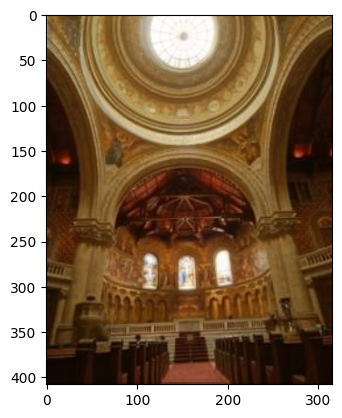

In [33]:
immagine_fusa = np.zeros(shape(aligned_images[0]))

#print("Shape immagine_fusa")
#print(shape(immagine_fusa))

for riga in range(h):
    for colonna in range(w):
        for n in range(len(aligned_images)):
            immagine_fusa[riga,colonna] = immagine_fusa[riga,colonna] + (aligned_images[n][riga,colonna] * normalized_W[n][riga,colonna])

#immagine_fusa=immagine_fusa/255

print("immagine fusa : ")
#print(shape(immagine_fusa))
#print(immagine_fusa)
plt.imshow(immagine_fusa)
plt.show()

immagine_fusa = immagine_fusa - np.min(immagine_fusa)
immagine_fusa = immagine_fusa / np.max(immagine_fusa)

plt.imsave("C:\\Users\\domen\\Desktop\\Computer Graphics\\Prj-ExposureFusion\\risultato.jpg",immagine_fusa)



Momento implementazione algoritmo buono : 
- decomposizione in piramide gaussiana

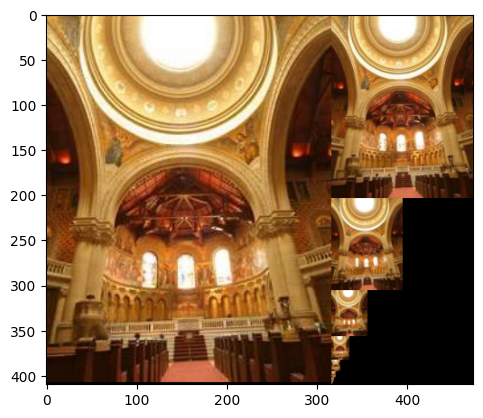

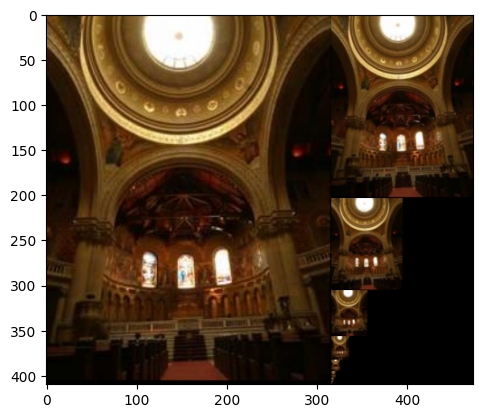

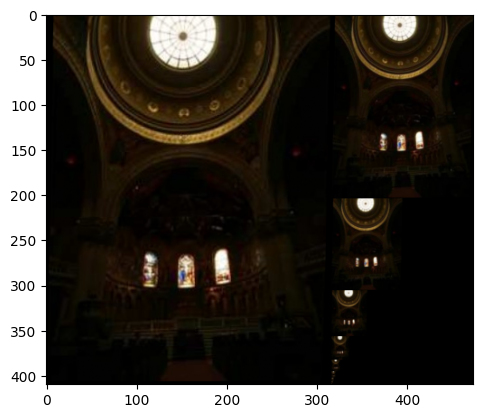

In [34]:
lista_piramidi_gaussiane = []

# Creazione delle n piramidi in base al numero di immagini in input
for img in aligned_images:
    image = img
    rows, cols, dim = image.shape
    pyramid = tuple(pyramid_gaussian(image, downscale=2, channel_axis=-1))
    lista_piramidi_gaussiane.append(pyramid)

    # - PROVA STAMPA PIRAMIDI
    #print(len(pyramid))
    #for n in range(len(pyramid)):
    #    plt.imshow(pyramid[n])
    #    plt.show()

    # determine the total number of rows and columns for the composite
    composite_rows = max(rows, sum(p.shape[0] for p in pyramid[1:]))
    composite_cols = cols + pyramid[1].shape[1]
    composite_image = np.zeros((composite_rows, composite_cols, 3), dtype=np.double)

    # store the original to the left
    composite_image[:rows, :cols, :] = pyramid[0]

    # stack all downsampled images in a column to the right of the original
    i_row = 0
    for p in pyramid[1:]:
        n_rows, n_cols = p.shape[:2]
        composite_image[i_row : i_row + n_rows, cols : cols + n_cols] = p
        i_row += n_rows

    fig, ax = plt.subplots()
    ax.imshow(composite_image)
    plt.show()

# - STAMPA PIRAMIDE UN'IMMAGINE ALLA VOLTA
#for piramide in lista_piramidi_gaussiane:
#    for n in piramide:
#        plt.imshow(n)
#        plt.show()

# - STAMPA IMMAGINI ORIGINALI
#for img in aligned_images : 
#    plt.imshow(img)
#    plt.show()

- scomposizione in piramidi laplaciane

shape l1
(51, 40, 3)
shape l2
(102, 79, 3)
Shape l1 upscaled
(102, 79, 3)


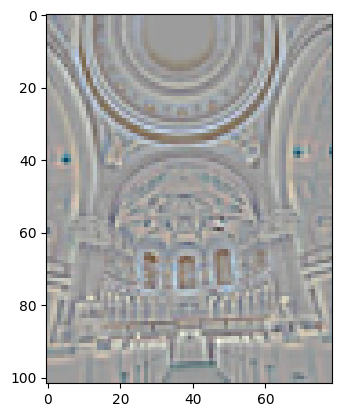

0.0
1.0
shape l1
(102, 79, 3)
shape l2
(204, 158, 3)
Shape l1 upscaled
(204, 158, 3)


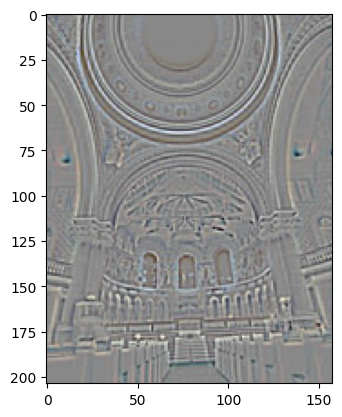

0.0
1.0
shape l1
(204, 158, 3)
shape l2
(408, 316, 3)
Shape l1 upscaled
(408, 316, 3)


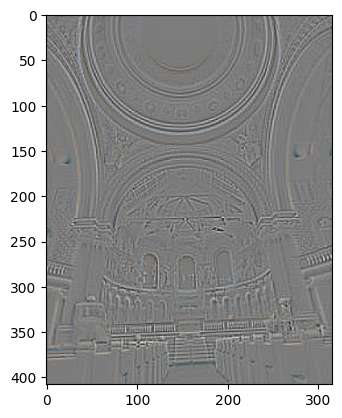

0.0
1.0
shape l1
(51, 40, 3)
shape l2
(102, 79, 3)
Shape l1 upscaled
(102, 79, 3)


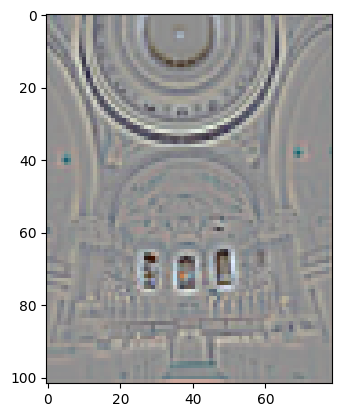

0.0
1.0
shape l1
(102, 79, 3)
shape l2
(204, 158, 3)
Shape l1 upscaled
(204, 158, 3)


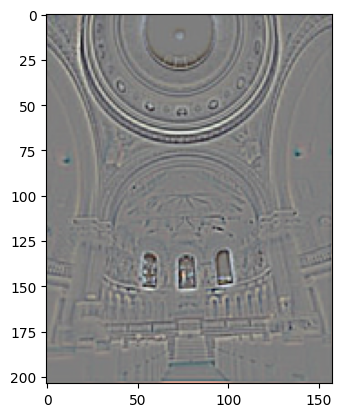

0.0
1.0
shape l1
(204, 158, 3)
shape l2
(408, 316, 3)
Shape l1 upscaled
(408, 316, 3)


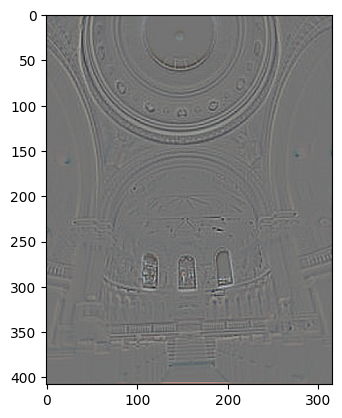

0.0
1.0
shape l1
(51, 40, 3)
shape l2
(102, 79, 3)
Shape l1 upscaled
(102, 79, 3)


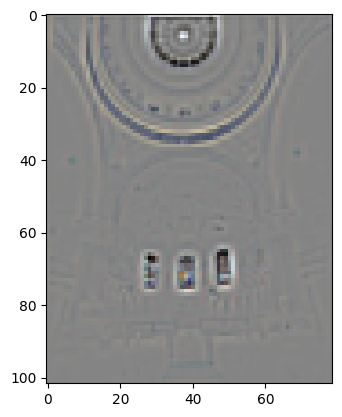

0.0
1.0
shape l1
(102, 79, 3)
shape l2
(204, 158, 3)
Shape l1 upscaled
(204, 158, 3)


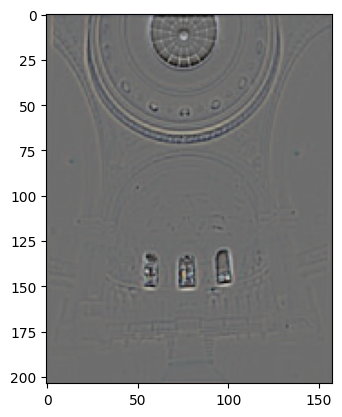

0.0
1.0
shape l1
(204, 158, 3)
shape l2
(408, 316, 3)
Shape l1 upscaled
(408, 316, 3)


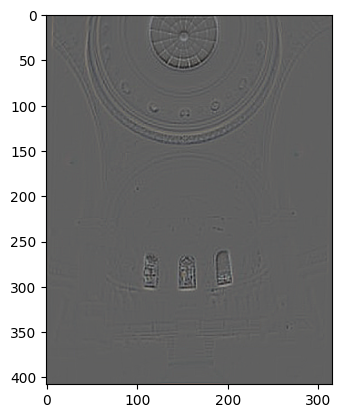

0.0
1.0
dimensione lista piramidi : 
3
numero piramidi per immagine : 
3
shape piramide
(102, 79, 3)
shape piramide
(204, 158, 3)
shape piramide
(408, 316, 3)
numero piramidi per immagine : 
3
shape piramide
(102, 79, 3)
shape piramide
(204, 158, 3)
shape piramide
(408, 316, 3)
numero piramidi per immagine : 
3
shape piramide
(102, 79, 3)
shape piramide
(204, 158, 3)
shape piramide
(408, 316, 3)


In [35]:
lista_piramidi_laplaciane = []

#print(shape(lista_piramidi_gaussiane))

for n_lista in range(len(lista_piramidi_gaussiane)):
    piramidi_laplaciane = []
    #print("lungezza lista attuale")
    #print(len(lista_piramidi_gaussiane[n_lista]))

    # - GESTISCE IL NUMERO DI IMMAGINI LAPLACIANE DA PRODURRE in modo da ottenere 3 livelli di piramide laplaciana
    # - - avere altri livelli avrebbe portato a produrre informazioni inutili
    numero_da_sottrarre = len(lista_piramidi_gaussiane[n_lista])-3

    #print(numero_da_sottrarre)

    # - Il ciclo è strutturato in modo da scorrere in al contrario gli elementi
    for n_piramide in range(len(lista_piramidi_gaussiane[n_lista])-numero_da_sottrarre):
        numero_piramidi = len(lista_piramidi_gaussiane[n_lista])
        l1 = copy.deepcopy(lista_piramidi_gaussiane[n_lista][(numero_piramidi-numero_da_sottrarre)-n_piramide])
        l2 = copy.deepcopy(lista_piramidi_gaussiane[n_lista][(numero_piramidi-numero_da_sottrarre)-n_piramide-1])
        
        # controllo di non essere andato oltre il numero di elementi memorizzati
        if(numero_piramidi-n_piramide-1!=-1):
            #print("Indice l1")
            #print((numero_piramidi-numero_da_sottrarre)-n_piramide)
            print("shape l1")
            print(shape(l1))
            #plt.imshow(l1)
            #plt.show()
            #print("")

            #print("Indice l2")
            #print((numero_piramidi-numero_da_sottrarre)-n_piramide-1)
            print("shape l2")
            print(shape(l2))
            #print("")
            #plt.imshow(l2)
            #plt.show()

            # - PROVO A IMPOSTARE I VALORI DI ZOOM IM MODO DA OTTENERE DIMENSIONI DESIDERATE
            # (Dopo tanti problemi legati alla non esatta dimensione delle immagini upscalate questa è la soluzione migliore individuata)
            [rl1,cl1,colori_l1] = shape(l1)
            [rl2,cl2,colori_l2] = shape(l2)
            zrl1 = rl2/rl1
            zcl1 = cl2/cl1
            l1 = scipy.ndimage.zoom(l1,(zrl1,zcl1,1),order=3)

            print("Shape l1 upscaled")
            print(shape(l1))
            
            piramide_laplaciana = l1-l2
            piramide_laplaciana = piramide_laplaciana - np.min(piramide_laplaciana)
            piramide_laplaciana = piramide_laplaciana / np.max(piramide_laplaciana) 
            piramidi_laplaciane.append(piramide_laplaciana)

            #print("risultato")
            plt.imshow(piramide_laplaciana)
            plt.show()
            print(np.min(piramide_laplaciana))
            print(np.max(piramide_laplaciana))
    lista_piramidi_laplaciane.append(piramidi_laplaciane)

# - STAMPA CONTROLLO NUMERO PIRAMIDI GENERATE
print("dimensione lista piramidi : ")
print(len(lista_piramidi_laplaciane))

# - STAMPE CONTROLLO NUMERO IMMAGINI GENERATE
for piramidi in lista_piramidi_laplaciane:
    print("numero piramidi per immagine : ")
    print(len(piramidi))
    for piramide in piramidi:
        print("shape piramide")
        print(shape(piramide))

- lista_piramidi_gaussiane -> contiene 11 immagini per ogni immagine di ingresso
- lista_piramidi_laplaciane -> contiene 3 immagini per ogni immagin in ingresso

Voglio che la lista delle piramidi gaussiane sia composta da tre livelli per immagine e che sia disposta con lo stesso ordine dei risultati ottenuti calcolando la Laplaciana

Piramidi Laplaciane
(102, 79, 3)


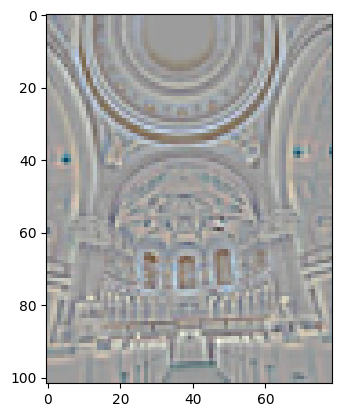

(204, 158, 3)


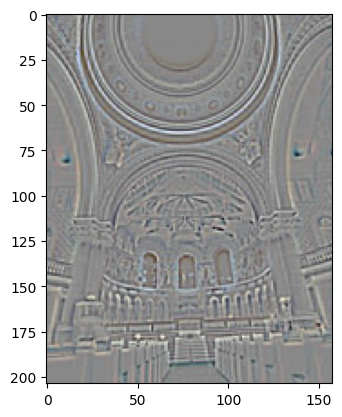

(408, 316, 3)


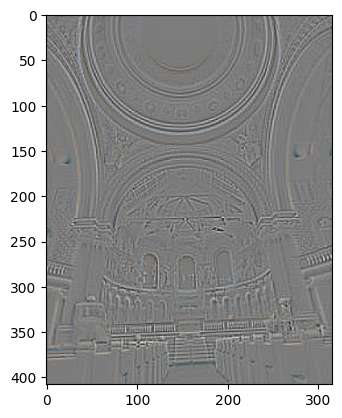

(102, 79, 3)


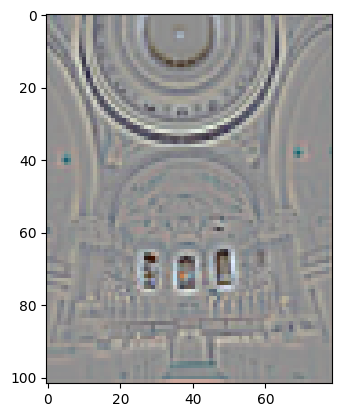

(204, 158, 3)


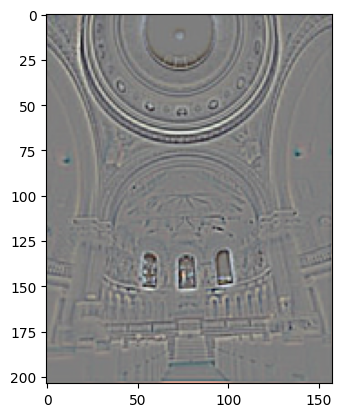

(408, 316, 3)


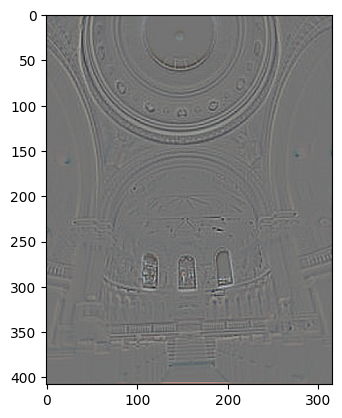

(102, 79, 3)


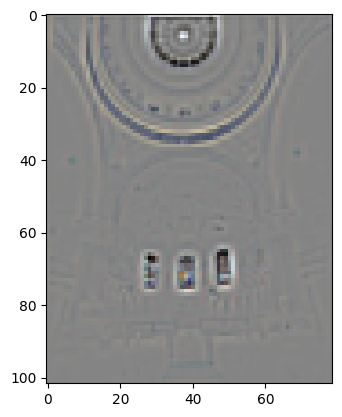

(204, 158, 3)


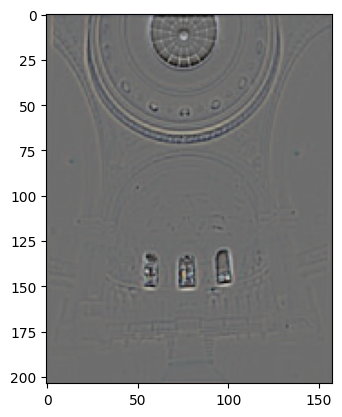

(408, 316, 3)


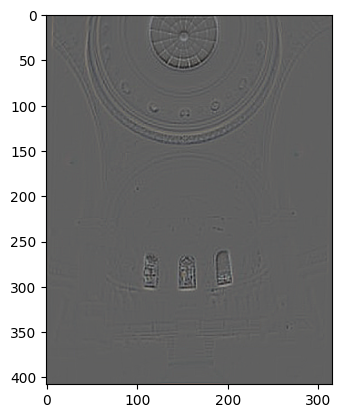

Piramidi Gaussiane


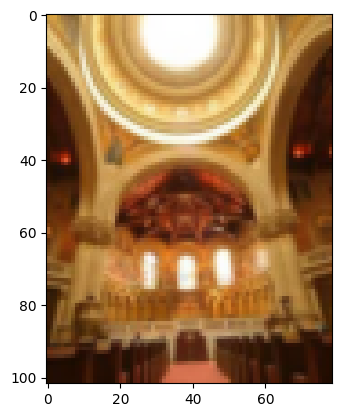

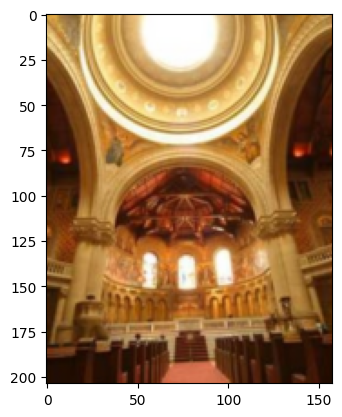

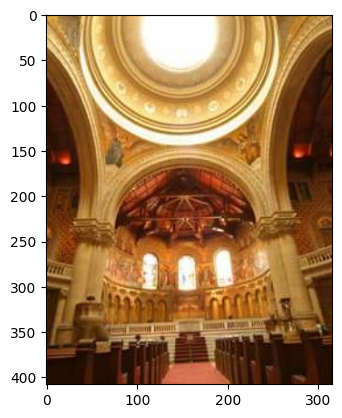

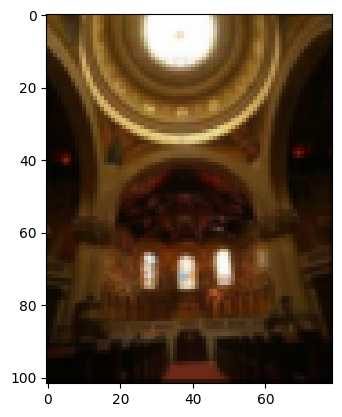

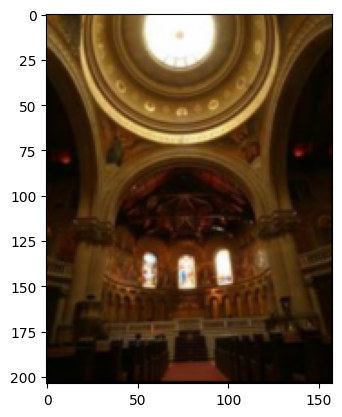

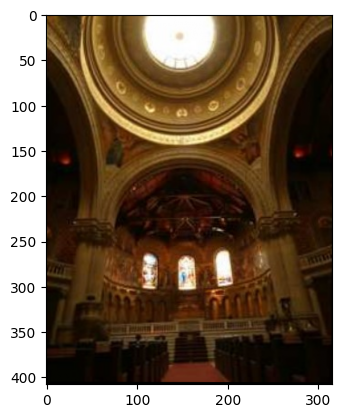

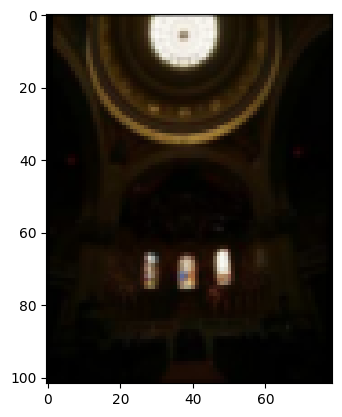

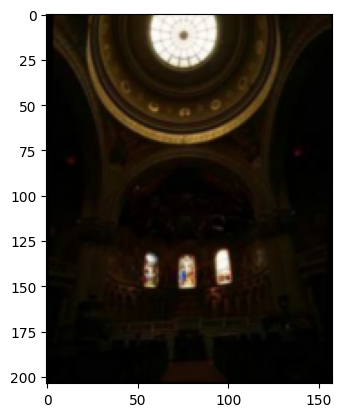

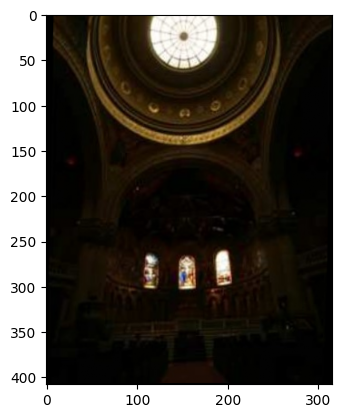

In [36]:
# - Manipolazioni della lista di gaussiane per ottenere il risultato desiderato
print("Piramidi Laplaciane")
for elem in lista_piramidi_laplaciane:
    for img in elem:
        print(shape(img))
        plt.imshow(img)
        plt.show()

lista_piramidi_gaussiane2 = []
lista_piramidi_gaussiane = list(lista_piramidi_gaussiane)

for elem in range(len(lista_piramidi_gaussiane)):
    immagini = []
    for img in range(len(lista_piramidi_gaussiane[elem])):
        if(img<=2):
            immagini.append(lista_piramidi_gaussiane[elem][img])
            #plt.imshow(lista_piramidi_gaussiane[elem][img])
            #plt.show()
    lista_piramidi_gaussiane2.append(immagini)

print("Piramidi Gaussiane")
for elem in lista_piramidi_gaussiane2:
    elem.reverse()
    for img in elem:
        plt.imshow(img)
        plt.show()
        

lista_piramidi_gaussiane -> contiene 11 immagini per ogni immagine di ingresso

lista_piramidi_gaussiane2 -> contiene 3 immagini per ogni immagine di ingresso nello stesso ordine delle laplaciane

lista_piramidi_laplaciane -> contiene 3 immagini per ogni immagin in ingresso

FUSIONE DELLE PIRAMIDI Gaussiana e Laplaciana insieme : 

In [37]:
# - conversione della piramide gaussiana in BN
lista_piramidi_gaussiane2_BN = []

for elem in lista_piramidi_gaussiane2:
    immagini = []
    for img in elem:
        #print(shape(img))
        img = rgb2gray(img)
        #print(shape(img))
        #plt.imshow(img)
        #plt.show()
        immagini.append(img)
    lista_piramidi_gaussiane2_BN.append(immagini)

#################################################################

# - conversione della piramide laplaciana in BN
lista_piramidi_laplaciane_BN = []

for elem in lista_piramidi_laplaciane:
    immagini = []
    for img in elem:
        #print(shape(img))
        img = rgb2gray(img)
        #print(shape(img))
        #plt.imshow(img)
        #plt.show()
        immagini.append(img)
    lista_piramidi_laplaciane_BN.append(immagini)

#####################################################################

# UNISCO LE DUE PIRAMIDI MOLTIPLICANDO I VALORI 
# - INUTILE
lista_piramidi_fuse_BN = []

for i in range(len(lista_piramidi_gaussiane2_BN)):
    piramidi_BN = []
    for j in range(len(lista_piramidi_gaussiane2_BN[i])):
        #print(shape(lista_piramidi_gaussiane2_BN[i][j]))
        #print(shape(lista_piramidi_laplaciana_BN[i][j]))
        
        piramide_fusa_BN = lista_piramidi_gaussiane2_BN[i][j]*lista_piramidi_laplaciane_BN[i][j]
        piramide_fusa_BN = piramide_fusa_BN - np.min(piramide_fusa_BN)
        piramide_fusa_BN = piramide_fusa_BN / np.max(piramide_fusa_BN)

        piramidi_BN.append(piramide_fusa_BN)
        
        # - PRINT DI SERVIZIO
        #print(shape(piramide_fusa))
        #print(np.min(piramide_fusa_BN))
        #print(np.max(piramide_fusa_BN))

        # - STAMPA RISULTATI
        #plt.imshow(piramide_fusa_BN,cmap="gray")
        #plt.show()
    lista_piramidi_fuse_BN.append(piramidi_BN)

# - STAMPA DELLE DIMENSIONI DEL RISULTATO
#print(len(lista_piramidi_fuse_BN))
#print(len(lista_piramidi_fuse_BN[0]))

- lista_piramidi_gaussiane -> contiene 11 immagini per ogni immagine di ingresso

- lista_piramidi_gaussiane2 -> contiene 11 immagini per ogni immagine di ingresso nello stesso ordine delle laplaciane
- lista_piramidi_laplaciane -> contiene 3 immagini per ogni immagin in ingresso
- lista_piramidi_gaussiane2_BN -> versione BN
- lista_piramidi_laplaciana_BN -> versione BN
- lista_piramidi_fuse_BN -> contiene il prodotto della gaussiana per la laplaciana 

Riorganizzazione dei risultati dividendoli in liste a seconda del livello della piramide che rappresentano.

(102, 79)
0.0
1.0


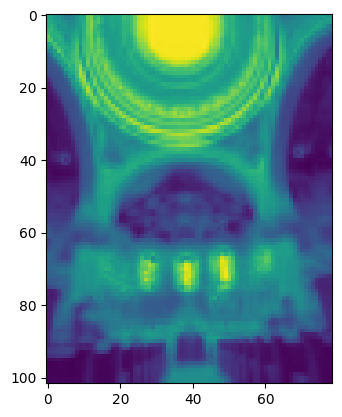

(102, 79)
0.0
1.0


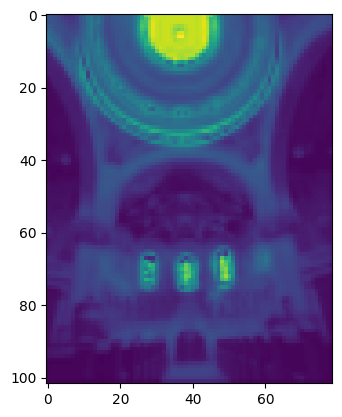

(102, 79)
0.0
1.0


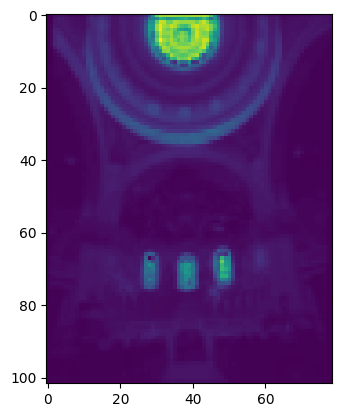

(204, 158)
0.0
1.0


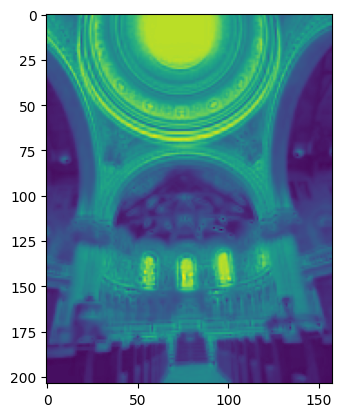

(204, 158)
0.0
1.0


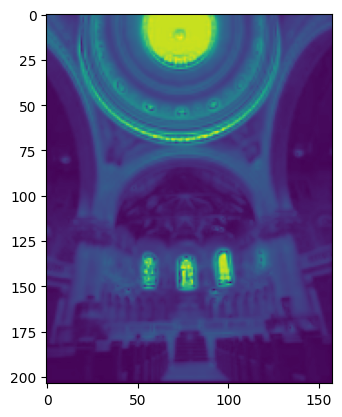

(204, 158)
0.0
1.0


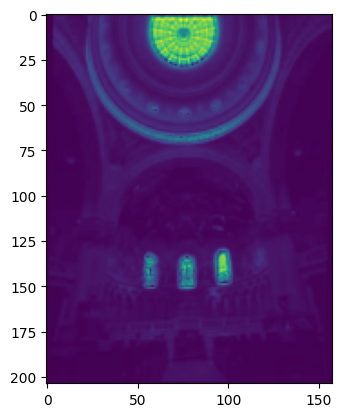

(408, 316)
0.0
1.0


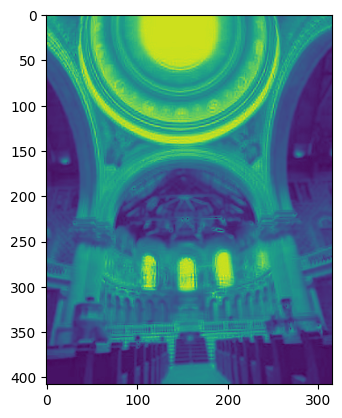

(408, 316)
0.0
1.0


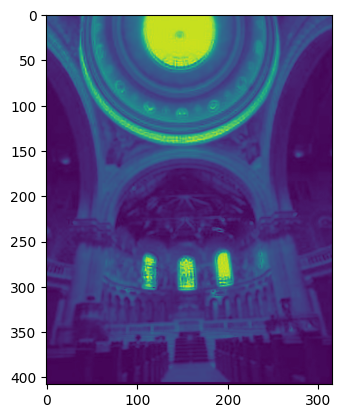

(408, 316)
0.0
1.0


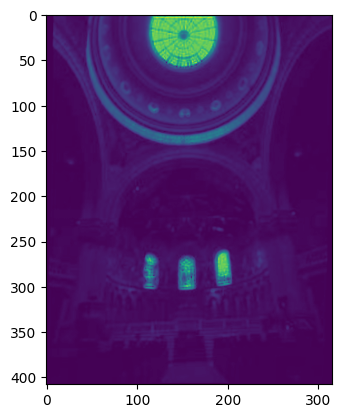

In [38]:
# CAPIRE COME UNIRE I VALORI DELLE MAPPE REALIZZATE

# - SCORRO TUTTE LE IMMAGINI FUSE
#for piramide in range(len(lista_piramidi_fuse_BN)):
#    for img in range(len(lista_piramidi_fuse_BN[piramide])):
#        immagine = lista_piramidi_fuse_BN[piramide][img]

        # - PRINT DI SERVIZIO
        #print(shape(immagine))
        #print(np.min(immagine))
        #print(np.max(immagine))
        #plt.imshow(immagine)
        #plt.show()

#print("len(lista_piramidi_fuse_BN[0]) : ")
#print(len(lista_piramidi_fuse_BN[0]))
#print("")

# - divido le mappe dei pesi moltiplicate per livello
lista_piramidi_fuse_x_livelli_BN = []
for i in range(len(lista_piramidi_fuse_BN[0])):
    immagini_lvl_i = []
    for j in range(len(lista_piramidi_fuse_BN)):
        immagini_lvl_i.append(lista_piramidi_fuse_BN[j][i])
    lista_piramidi_fuse_x_livelli_BN.append(immagini_lvl_i)
    #print(" i : ")
    #print(i)
    #print("-")


for lvl in lista_piramidi_fuse_x_livelli_BN:
    for img in lvl:
        print(shape(img))
        print(np.min(img))
        print(np.max(img))
        plt.imshow(img)
        plt.show()

- lista_piramidi_gaussiane -> contiene 11 immagini per ogni immagine di ingresso
- lista_piramidi_gaussiane2 -> contiene 11 immagini per ogni immagine di ingresso nello stesso ordine delle laplaciane
- lista_piramidi_laplaciane -> contiene 3 immagini per ogni immagin in ingresso
- lista_piramidi_gaussiane2_BN -> versione BN
- lista_piramidi_laplaciana_BN -> versione BN
- lista_piramidi_fuse_BN -> contiene il prodotto della gaussiana per la laplaciana 
- lista_piramidi_fuse_x_livelli -> immagini raggruppate per livelli

Normalizzazione della somma dei pesi di ogni immagine per ogni livello in modo che il totale per ogni pixel sia 1

In [39]:
################################################

# - codice della normalizzazione fatta prima
#print("Shape W")
#print(shape(W))

#normalized_W = np.zeros(shape(W))

#print("shape(normalized_W)")
#print(shape(normalized_W))

#for riga in range(h):
#    for colonna in range(w):
#        somma_pesi_pixel = 0
#        for n in range(len(W)):
#            somma_pesi_pixel = somma_pesi_pixel + W[n][riga,colonna]
#        for n in range(len(W)):
#            if(somma_pesi_pixel!=0):
#                normalized_W[n][riga,colonna] = W[n][riga,colonna]/somma_pesi_pixel
#            else :  
#                normalized_W[n][riga,colonna] = 0

################################################

# - DEVO ORA FARE IN MODO CHE PER OGNI LIVELLO, PER OGNI IMMAGINE LA SOMMA DEI PESI DELLE MAPPE SIA 1
lista_piramidi_fuse_x_livelli_normalizzate_BN = []

for lvl in range(len(lista_piramidi_fuse_x_livelli_BN)):

    righe,colonne = shape(lista_piramidi_fuse_x_livelli_BN[lvl][0])

    lista_piramidi_lvl_attuale = np.zeros(shape(lista_piramidi_fuse_x_livelli_BN[lvl]))
    #print(shape(lista_piramidi_lvl_attuale))
    

    # - X DOMENICO
    # - - POPOLA LA LISTA INSERENDO I VALORI NORMALIZZATI PER OGNI IMMAGINE
    
    #print(lvl)
    #print(h,w)
    #print(img)

    for riga in range(righe):

        for colonna in range(colonne):

            somma_pesi_pixel = 0
            #print(somma_pesi_pixel)


            for img in range(len(lista_piramidi_fuse_x_livelli_BN[lvl])):

                #print(somma_pesi_pixel)

                somma_pesi_pixel = somma_pesi_pixel + lista_piramidi_fuse_x_livelli_BN[lvl][img][riga,colonna]

                #plt.imshow(immagine_attuale)
                #plt.show()

                #print(somma_pesi_pixel)
            
            for img in range(len(lista_piramidi_fuse_x_livelli_BN[lvl])):
                #print(img)
                
                if(somma_pesi_pixel!=0):
                    lista_piramidi_lvl_attuale[img][riga,colonna] = lista_piramidi_fuse_x_livelli_BN[lvl][img][riga,colonna]/somma_pesi_pixel
                else : 
                    lista_piramidi_lvl_attuale[img][riga,colonna] = 0

    lista_piramidi_fuse_x_livelli_normalizzate_BN.append(lista_piramidi_lvl_attuale)

# - PRINT DI SERVIZIO
#print("len(lista_piramidi_fuse_x_livelli_normalizzate)")
#print(len(lista_piramidi_fuse_x_livelli_normalizzate)) 
#print("")
#for lvl in lista_piramidi_fuse_x_livelli_normalizzate:
#    print("len(lvl)")
#    print(len(lvl))
#    for img in lvl:
#        print("shape(img)")
#        print(shape(img))
#        print(np.min(img))
#        print(np.max(img))
#        plt.imshow(img)
#        plt.show()
#        print(img[0,0])

- lista_piramidi_gaussiane -> contiene 11 immagini per ogni immagine di ingresso
- lista_piramidi_gaussiane2 -> contiene 3 immagini per ogni immagine di ingresso nello stesso ordine delle laplaciane
- lista_piramidi_laplaciane -> contiene 3 immagini per ogni immagin in ingresso
- lista_piramidi_gaussiane2_BN -> versione BN
- lista_piramidi_laplaciana_BN -> versione BN
- lista_piramidi_fuse_BN -> contiene il prodotto della gaussiana per la laplaciana 
- lista_piramidi_fuse_x_livelli_BN -> immagini raggruppate per livelli
- lista_piramidi_fuse_x_livelli_normalizzate_BN -> immagini raggruppate per livelli con somma a 1 per livello

Fusione delle immagini per livello e ottenimento dei risultati

(102, 79, 3)


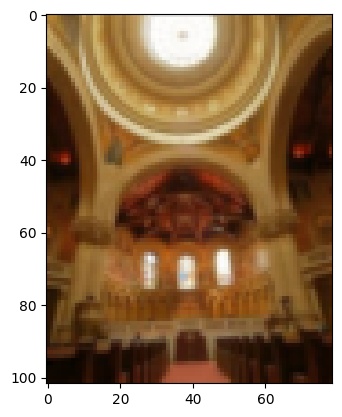

(204, 158, 3)


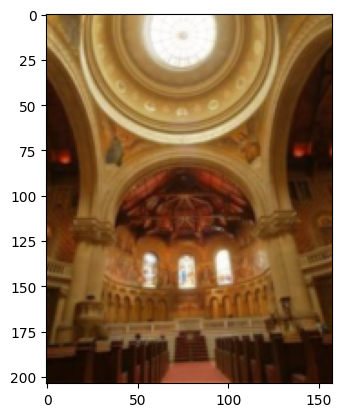

(408, 316, 3)


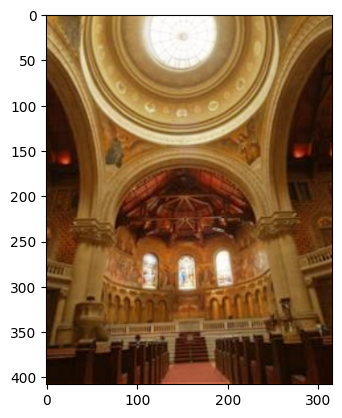

In [40]:
#print(len(lista_piramidi_gaussiane2))
#print(len(lista_piramidi_gaussiane2[0]))

#for lvl in lista_piramidi_gaussiane2:
#    for img in lvl:
#        plt.imshow(img)
#        plt.show()

################################################

#immagine_fusa = np.zeros(shape(aligned_images[0]))

#print("Shape immagine_fusa")
#print(shape(immagine_fusa))

#for riga in range(h):
#    for colonna in range(w):
#        for n in range(len(aligned_images)):
#            immagine_fusa[riga,colonna] = immagine_fusa[riga,colonna] + (aligned_images[n][riga,colonna] * normalized_W[n][riga,colonna])

################################################

#for lista in lista_piramidi_laplaciane:
#    for img in lista:
#        print(shape(img))
#        plt.imshow(img)
#        plt.show()

lista_immagini_fuse_x_lvl = []

for lvl in range(len(lista_piramidi_fuse_x_livelli_normalizzate_BN)):
    #print(lvl)

    immagine_fusa_lvl_attuale = np.zeros(shape(lista_piramidi_laplaciane[0][lvl]))
    #print(shape(immagine_fusa_lvl_attuale))

    righe,colonne,colore = shape(immagine_fusa_lvl_attuale)
    #print(righe)
    #print(colonne)

    for riga in range(righe):
        for colonna in range(colonne):
            for img in range(len(lista_piramidi_fuse_x_livelli_normalizzate_BN[lvl])):
                #print(img)

                #plt.imshow(lista_piramidi_fuse_x_livelli_normalizzate_BN[lvl][img])
                #plt.show()

                #plt.imshow(lista_piramidi_gaussiane2[img][lvl])
                #plt.show()

                immagine_fusa_lvl_attuale[riga,colonna] = immagine_fusa_lvl_attuale[riga,colonna] + lista_piramidi_fuse_x_livelli_normalizzate_BN[lvl][img][riga,colonna]*lista_piramidi_gaussiane2[img][lvl][riga,colonna]

    immagine_fusa_lvl_attuale = immagine_fusa_lvl_attuale - np.min(immagine_fusa_lvl_attuale)
    immagine_fusa_lvl_attuale = immagine_fusa_lvl_attuale / np.max(immagine_fusa_lvl_attuale)

    lista_immagini_fuse_x_lvl.append(immagine_fusa_lvl_attuale)



#print(len(lista_immagini_fuse_x_lvl))
for img in lista_immagini_fuse_x_lvl:
    print(shape(img))
    plt.imshow(img)
    plt.show()



# Salvataggio solo dell'immagine risultante con risoluzione maggiore
plt.imsave("C:\\Users\\domen\\Desktop\\Computer Graphics\\Prj-ExposureFusion\\risultato2.jpg",lista_immagini_fuse_x_lvl[len(lista_immagini_fuse_x_lvl)-1])


ORA : devo prendere la piramide risultato e espanderla per ottenere il livello massimo di dettaglio

(Non va bene)

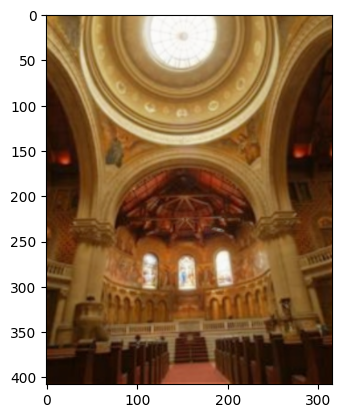

In [41]:
# - RISULTATO NON SODDISFACENTE

c = 0

for indice in range(len(lista_immagini_fuse_x_lvl)):
    
    l1 = copy.deepcopy(lista_immagini_fuse_x_lvl[indice])

    if((indice+1)<len(lista_immagini_fuse_x_lvl)):
        #print(indice+1)

        l2 = copy.deepcopy(lista_immagini_fuse_x_lvl[indice+1])

        rl1,cl1,coloril1 = shape(l1)
        rl2,cl2,coloril2 = shape(l2)

        zrl1 = rl2/rl1
        zcl1 = cl2/cl1

        l1 = scipy.ndimage.zoom(l1,(zrl1,zcl1,1),order=3)

        l1 = l1 - np.min(l1)
        l1 = l1 / np.max(l1)

        #print(shape(l1))
        #print(shape(l2))

        #plt.imshow(l1)
        #plt.show()
        #plt.imshow(l2)
        #plt.show()

        somma = l1 + l2
        
        if(c==0): 
            risultato = somma
        else:
            risultato = risultato + somma

        #print(shape(risultato))

        risultato = risultato - np.min(risultato)
        risultato = risultato / np.max(risultato)

plt.imshow(risultato)
plt.show()
#plt.imsave("C:\\Users\\domen\\Desktop\\Computer Graphics\\Prj-ExposureFusion\\risultato3.jpg",risultato)
